* Course: DSC670
* Title: Week 3 Exercise
* Author Nels Findley
* 12/21/2025
* Description: Image Generator and Editor

# Generate and Modify an Image using Stable Diffusion API

The first block of code is a function generate_image() that communicates with Stable Diffusion API. 
Prompt: "A futuristic city of Lincoln Nebraska, vibrant colors" 
The scripts senda  POST request containg the prompt and returns with base64 string that is decoded into a .png file.
The results are a file named generate_0.png is saved in the current directory. The code uses a for loop if multiple images are sent back from the API.

The second block of code uses function edit_generate_images() to modify an existing image generated in the first code block.
Transformation Prompt: "Futuristic city skyline, Ukiyo-e style, Hokusai woodblock print, bold ink lines, traditional Japanese colors, cherry blossoms in the foreground"
The results generate a new file called edited_image.png. The new generated image retain the same layout from the previous image but overlays it with traditional Japanese style building and cherry blossoms.

Through the process I found last week of documentation with OpenAi to be easier to use with initial setup. The getting started page on Stable Diffusion didn't have quick example to get started with compared to OpenAI. The advantage I found with Stable Diffusion is the free credit it provided. For the assignment I didn't need to add any money to this account compared to OpenAI. 



In [8]:
# Library setup
import requests
import os
import base64
from IPython.display import Image, display

STABILITY_API_KEY = "Removed"


In [3]:
def generate_image(prompt):
    url = "https://api.stability.ai/v1/generation/stable-diffusion-xl-1024-v1-0/text-to-image"
    
    headers = {
        "Accept": "application/json",
        "Content-Type": "application/json",
        "Authorization": f"Bearer {STABILITY_API_KEY}",
    }
    
    payload = {
        "text_prompts": [{"text": prompt}],
        "cfg_scale": 7,
        "height": 1024,
        "width": 1024,
        "samples": 1,
        "steps": 30,
    }

    response = requests.post(url, headers=headers, json=payload)

    if response.status_code == 200:
        data = response.json()
        for i, image in enumerate(data["artifacts"]):
            with open(f"generated_{i}.png", "wb") as f:
                import base64
                f.write(base64.b64decode(image["base64"]))
        print("Image generated successfully!")
    else:
        print(f"Error: {response.text}")

generate_image("A futuristic city of Lincoln Nebraska, vibrant colors")

Image generated successfully!


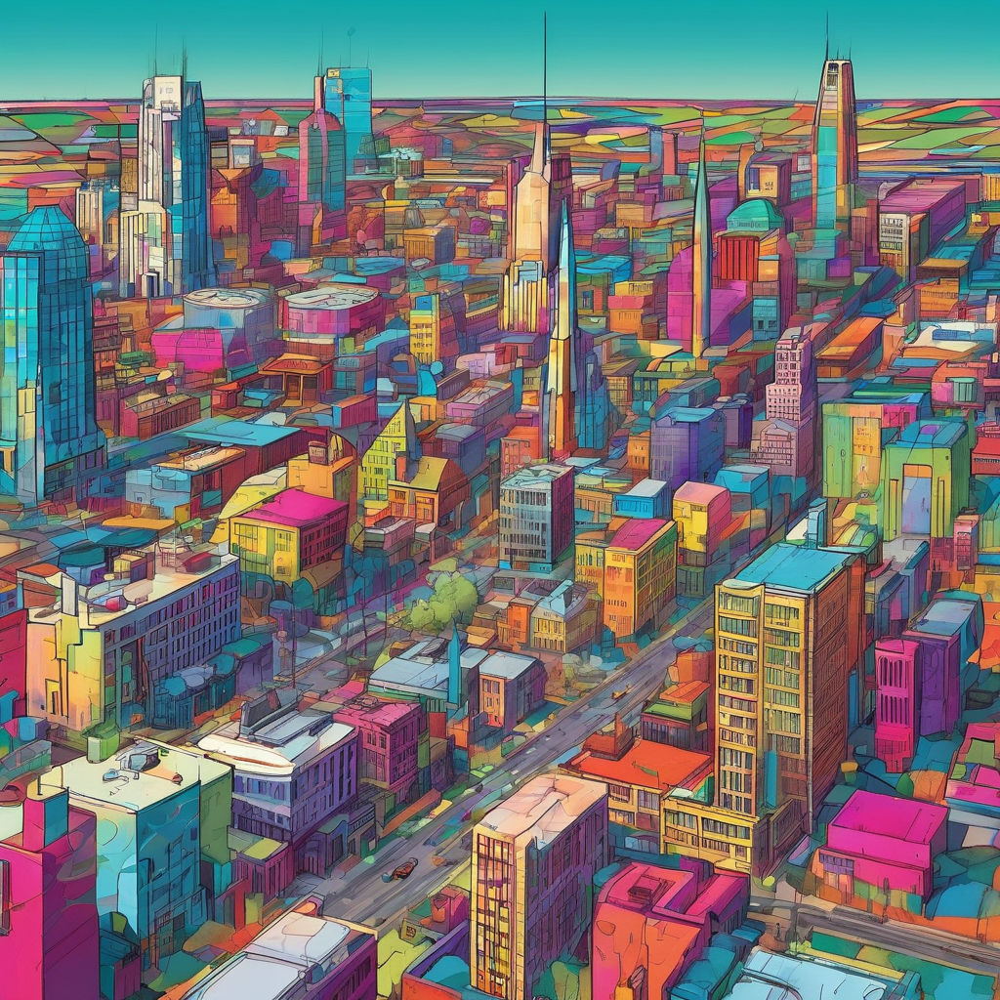

In [5]:
# Display an image from a file path
display(Image(filename='generated_0.png'))

In [12]:
def edit_generated_image(input_image_path, prompt, output_name="edited_image.png"):
    url = "https://api.stability.ai/v1/generation/stable-diffusion-xl-1024-v1-0/image-to-image"
    
    headers = {
        "Accept": "application/json",
        "Authorization": f"Bearer {STABILITY_API_KEY}",
    }

    files = {
        "init_image": open(input_image_path, "rb")
    }
    
    data = {
        "image_strength": 0.45,
        "init_image_mode": "IMAGE_STRENGTH",
        "text_prompts[0][text]": prompt,
        "cfg_scale": 8,
        "samples": 1,
        "steps": 30,
    }

    response = requests.post(url, headers=headers, files=files, data=data)

    if response.status_code == 200:
        data = response.json()
        for i, image in enumerate(data["artifacts"]):
            with open(output_name, "wb") as f:
                f.write(base64.b64decode(image["base64"]))
        print(f"Success! Edited image saved as: {output_name}")
    else:
        print(f"Error: {response.status_code} - {response.text}")

new_prompt = "Futuristic city skyline, Ukiyo-e style, Hokusai woodblock print, bold ink lines, traditional Japanese colors, cherry blossoms in the foreground"

edit_generated_image("generated_0.png", new_prompt)

Success! Edited image saved as: edited_image.png


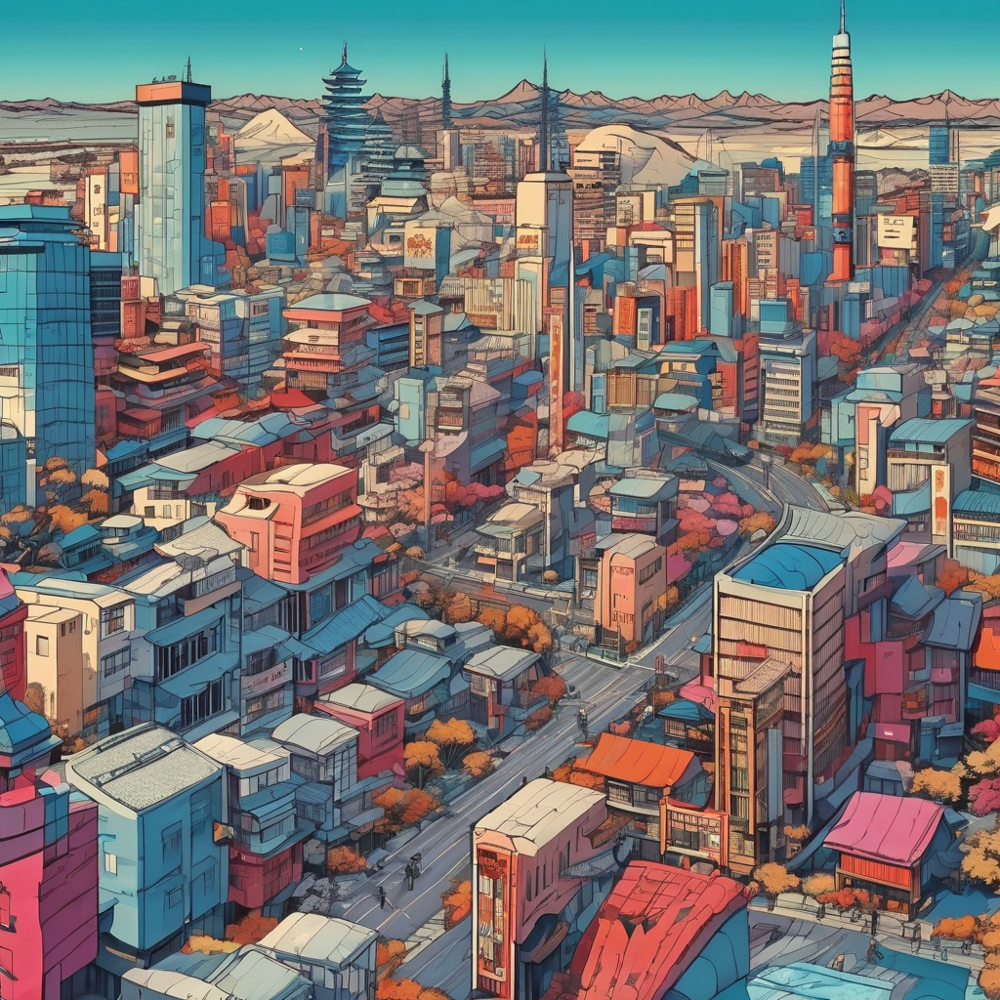

In [11]:
display(Image(filename='edited_image.png'))